In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
import plotly.express as px
import folium
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

In [2]:
df = pd.read_csv("C:/Users/riya1/Downloads/STAT 641/RIYA/Final Project/train.csv")

In [3]:
df.head(5)

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds
0,6901257,5.010635,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",3,1.0,Real Bed,strict,True,...,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,https://a0.muscache.com/im/pictures/6d7cbbf7-c...,11201,1.0,1.0
1,6304928,5.129899,Apartment,Entire home/apt,"{""Wireless Internet"",""Air conditioning"",Kitche...",7,1.0,Real Bed,strict,True,...,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,https://a0.muscache.com/im/pictures/348a55fe-4...,10019,3.0,3.0
2,7919400,4.976734,Apartment,Entire home/apt,"{TV,""Cable TV"",""Wireless Internet"",""Air condit...",5,1.0,Real Bed,moderate,True,...,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,https://a0.muscache.com/im/pictures/6fae5362-9...,10027,1.0,3.0
3,13418779,6.620073,House,Entire home/apt,"{TV,""Cable TV"",Internet,""Wireless Internet"",Ki...",4,1.0,Real Bed,flexible,True,...,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,NaN,https://a0.muscache.com/im/pictures/72208dad-9...,94117.0,2.0,2.0
4,3808709,4.744932,Apartment,Entire home/apt,"{TV,Internet,""Wireless Internet"",""Air conditio...",2,1.0,Real Bed,moderate,True,...,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,NaN,20009,0.0,1.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74111 entries, 0 to 74110
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id                      74111 non-null  int64  
 1   log_price               74111 non-null  float64
 2   property_type           74111 non-null  object 
 3   room_type               74111 non-null  object 
 4   amenities               74111 non-null  object 
 5   accommodates            74111 non-null  int64  
 6   bathrooms               73911 non-null  float64
 7   bed_type                74111 non-null  object 
 8   cancellation_policy     74111 non-null  object 
 9   cleaning_fee            74111 non-null  bool   
 10  city                    74111 non-null  object 
 11  description             74111 non-null  object 
 12  first_review            58247 non-null  object 
 13  host_has_profile_pic    73923 non-null  object 
 14  host_identity_verified  73923 non-null

In [5]:
df.isnull().sum()

id                            0
log_price                     0
property_type                 0
room_type                     0
amenities                     0
accommodates                  0
bathrooms                   200
bed_type                      0
cancellation_policy           0
cleaning_fee                  0
city                          0
description                   0
first_review              15864
host_has_profile_pic        188
host_identity_verified      188
host_response_rate        18299
host_since                  188
instant_bookable              0
last_review               15827
latitude                      0
longitude                     0
name                          0
neighbourhood              6872
number_of_reviews             0
review_scores_rating      16722
thumbnail_url              8216
zipcode                     966
bedrooms                     91
beds                        131
dtype: int64

In [6]:
#Change object datatype to datetime
df["last_review"] = pd.to_datetime(df["last_review"])
df["host_since"] = pd.to_datetime(df["host_since"])
df["first_review"] = pd.to_datetime(df["first_review"])

In [7]:
#Replace NULL values with previous lines
df.last_review.fillna(method="ffill",inplace=True)
df.first_review.fillna(method="ffill",inplace=True)
df.host_since.fillna(method="ffill",inplace=True)

In [8]:
#Replace NULL values with 0
df["review_scores_rating"] = df["review_scores_rating"].fillna(0)

In [9]:
#Replace NULL values with mean value
df["bathrooms"] = df['bathrooms'].fillna(round(df["bathrooms"].mean()))
df["bedrooms"] = df['bedrooms'].fillna((df["bedrooms"].mean()))
df["beds"] = df["beds"].fillna((df["beds"].mean()))

In [10]:
df = df[df['neighbourhood'].notna()]

In [11]:
df.isnull().sum()

id                            0
log_price                     0
property_type                 0
room_type                     0
amenities                     0
accommodates                  0
bathrooms                     0
bed_type                      0
cancellation_policy           0
cleaning_fee                  0
city                          0
description                   0
first_review                  0
host_has_profile_pic        185
host_identity_verified      185
host_response_rate        17335
host_since                    0
instant_bookable              0
last_review                   0
latitude                      0
longitude                     0
name                          0
neighbourhood                 0
number_of_reviews             0
review_scores_rating          0
thumbnail_url              7262
zipcode                     579
bedrooms                      0
beds                          0
dtype: int64

In [12]:
#Change Amenities column with number of amenities
NumberOfAmenities = []
for i in df["amenities"]:
    NumberOfAmenities.append(len(i))
#Replace Amenities column 
df["amenities"] = NumberOfAmenities

In [13]:
df.head(5)

,id,log_price,property_type,room_type,amenities,accommodates,bathrooms,bed_type,cancellation_policy,cleaning_fee,...,latitude,longitude,name,neighbourhood,number_of_reviews,review_scores_rating,thumbnail_url,zipcode,bedrooms,beds
0,6901257,5.010635,Apartment,Entire home/apt,152,3,1.0,Real Bed,strict,True,...,40.696524,-73.991617,Beautiful brownstone 1-bedroom,Brooklyn Heights,2,100.0,https://a0.muscache.com/im/pictures/6d7cbbf7-c...,11201,1.0,1.0
1,6304928,5.129899,Apartment,Entire home/apt,218,7,1.0,Real Bed,strict,True,...,40.766115,-73.989040,Superb 3BR Apt Located Near Times Square,Hell's Kitchen,6,93.0,https://a0.muscache.com/im/pictures/348a55fe-4...,10019,3.0,3.0
2,7919400,4.976734,Apartment,Entire home/apt,311,5,1.0,Real Bed,moderate,True,...,40.808110,-73.943756,The Garden Oasis,Harlem,10,92.0,https://a0.muscache.com/im/pictures/6fae5362-9...,10027,1.0,3.0
3,13418779,6.620073,House,Entire home/apt,210,4,1.0,Real Bed,flexible,True,...,37.772004,-122.431619,Beautiful Flat in the Heart of SF!,Lower Haight,0,0.0,https://a0.muscache.com/im/pictures/72208dad-9...,94117.0,2.0,2.0
4,3808709,4.744932,Apartment,Entire home/apt,174,2,1.0,Real Bed,moderate,True,...,38.925627,-77.034596,Great studio in midtown DC,Columbia Heights,4,40.0,NaN,20009,0.0,1.0


In [14]:
df.describe()

,id,log_price,amenities,accommodates,bathrooms,latitude,longitude,number_of_reviews,review_scores_rating,bedrooms,beds
count,6.723900e+04,67239.000000,67239.000000,67239.000000,67239.000000,67239.000000,67239.000000,67239.000000,67239.000000,67239.000000,67239.000000
mean,1.126689e+07,4.798970,268.829281,3.134267,1.227866,38.758922,-90.544014,21.460328,73.235503,1.260839,1.702454
std,6.079879e+06,0.710094,111.563625,2.119001,0.570200,2.948197,21.420181,38.591495,39.658555,0.846252,1.235767
min,9.410000e+02,0.000000,2.000000,1.000000,0.000000,33.705835,-122.511500,0.000000,0.000000,0.000000,0.000000
25%,6.262404e+06,4.317488,195.000000,2.000000,1.000000,34.213493,-118.329868,1.000000,80.000000,1.000000,1.000000
50%,1.225412e+07,4.744932,262.000000,2.000000,1.000000,40.681279,-74.000464,6.000000,94.000000,1.000000,1.000000
75%,1.640238e+07,5.241747,329.000000,4.000000,1.000000,40.753167,-73.951420,24.000000,99.000000,1.000000,2.000000
max,2.123090e+07,7.600402,1496.000000,16.000000,8.000000,42.390437,-70.985047,542.000000,100.000000,10.000000,18.000000


Text(0.5, 1.0, 'Histogram of City')

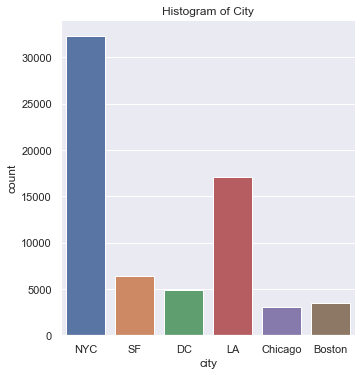

In [15]:
#City wise count
sns.set(font_scale=1)

sns.catplot(x = "city", kind="count", data=df)
plt.title('Histogram of City')

<AxesSubplot:title={'center':'Price distribution'}, xlabel='log_price', ylabel='Count'>

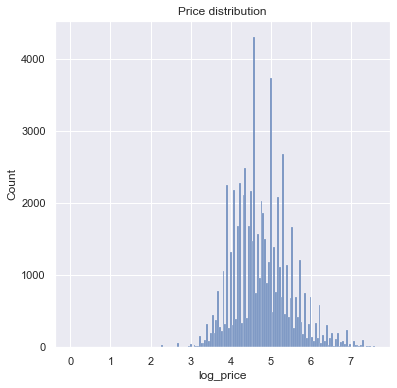

In [16]:
#Check the price distribution
plt.figure(figsize = (6, 6))
plt.title('Price distribution')
sns.histplot(df["log_price"])

Text(0.5, 1.0, 'Histogram of Room type')

<Figure size 576x576 with 0 Axes>

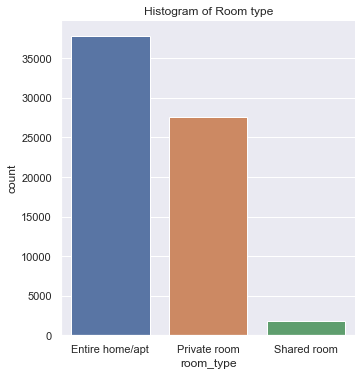

In [17]:
sns.set(font_scale=1)
plt.figure(figsize = (8, 8))
sns.catplot(x = "room_type", kind="count", data=df)
plt.title('Histogram of Room type')

<AxesSubplot:>

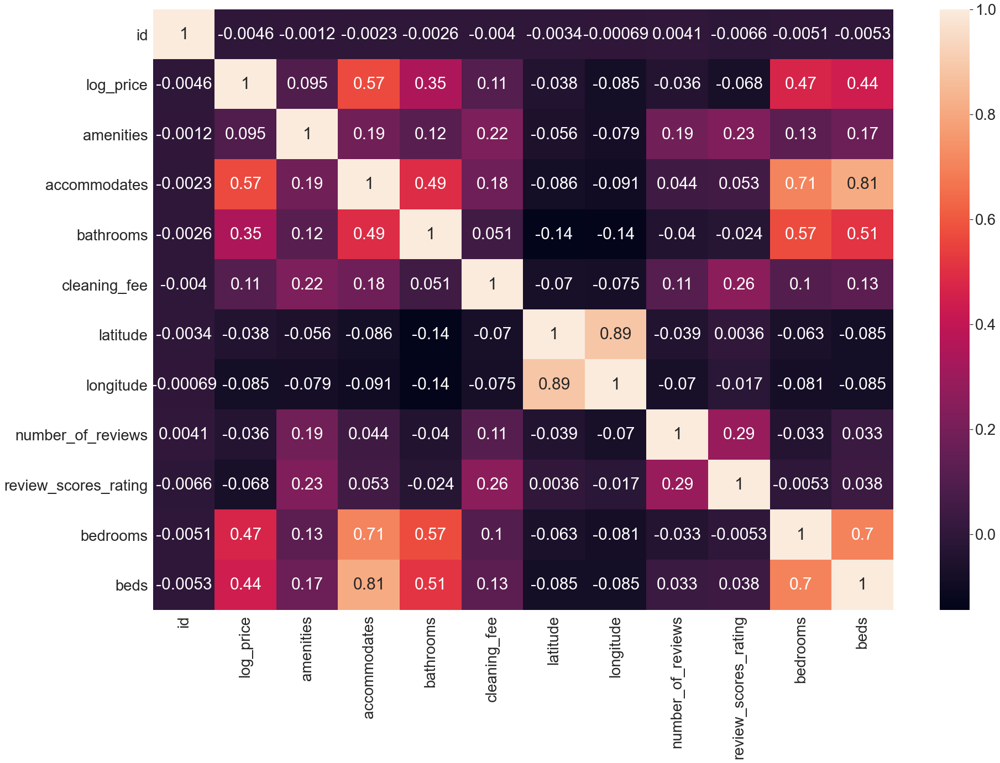

In [18]:
#Correlation table
sns.set(font_scale=2.5)
plt.figure(figsize=(30,20))
sns.heatmap(df.corr(), annot=True)

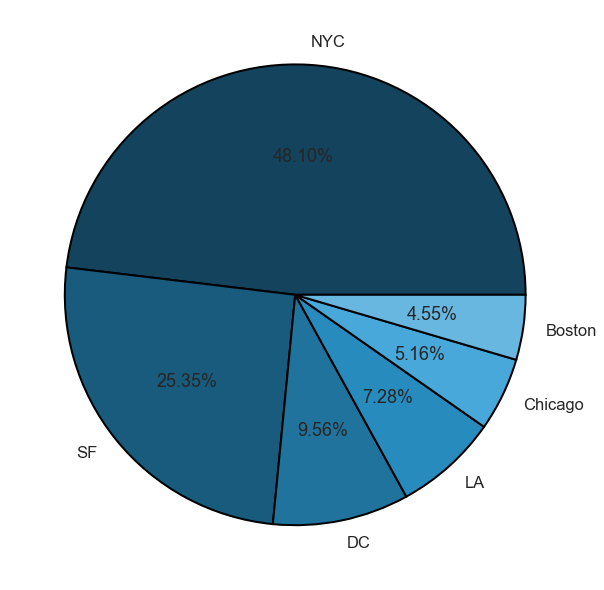

In [19]:
#City wise data 
add_axes = plt.figure(figsize=(8,8))
sns.set(font_scale=1.5)
axis = add_axes.add_axes([0,0,1,1])
city_names = list(df.city.unique())
colors = ["#13435d", "#195b7d", "#20739d", "#278bbe","#47a8d9","#68b7e0"]
count =list(df.city.value_counts())
axis.pie(count, labels = city_names,colors=colors,autopct='%1.2f%%',wedgeprops = {"linewidth": 2, "edgecolor": "black"})
plt.show()


<AxesSubplot:title={'center':'Room Type vs Price'}, xlabel='room_type', ylabel='log_price'>

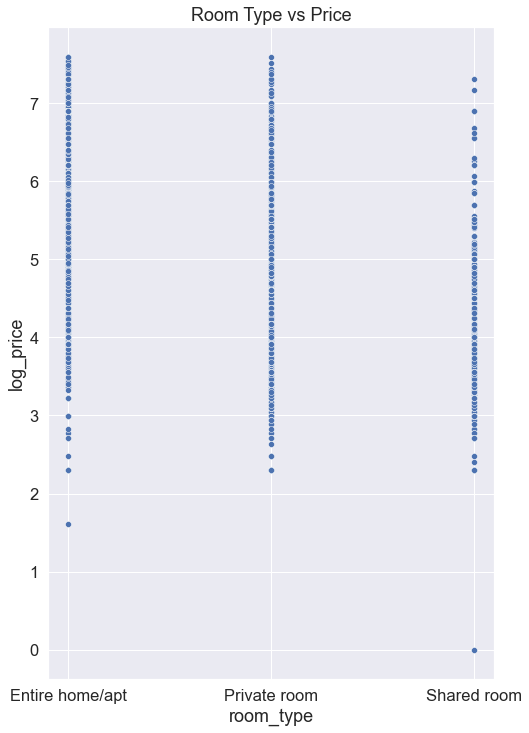

In [20]:
plt.figure(figsize=(8,12))
plt.title("Room Type vs Price")
sns.scatterplot(x='room_type', y='log_price', data=df)

In [21]:
correlation=df.corr(method='pearson')
VifValue, Vif=np.linalg.eig(correlation)
VifValue

array([3.43014848, 1.86685771, 1.6005364 , 1.00022106, 0.10853532,
       0.17228495, 0.30479247, 0.87934574, 0.77998059, 0.71468596,
       0.61005264, 0.53255868])

In [22]:
location = px.scatter_mapbox(df, lat="latitude", lon="longitude", hover_name="city",
                        color_discrete_sequence=["red"], zoom=2, height=400)
location.update_layout(mapbox_style="open-street-map")
location.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

<BarContainer object of 10 artists>

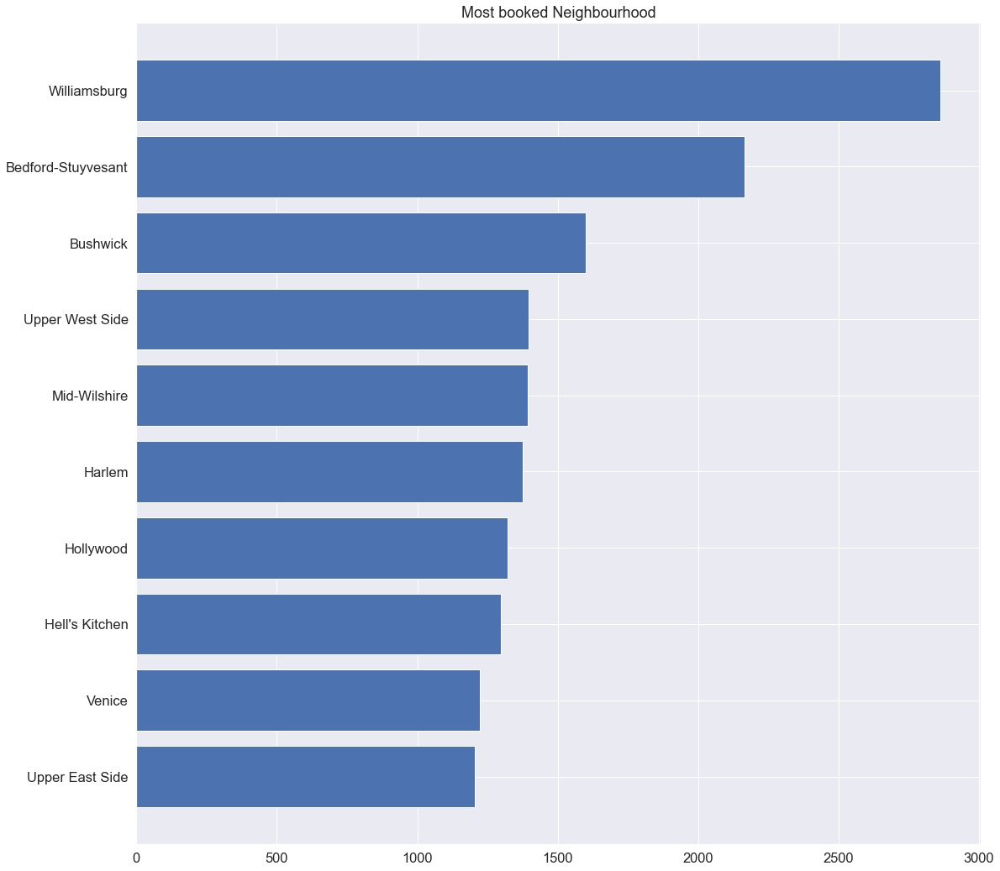

In [23]:
df2 = df.neighbourhood.value_counts()[:10]
x_val = list(df2.index)
y_val = list(df2.values)
x_val.reverse()
y_val.reverse()
plt.figure(figsize=(18,18))
plt.title("Most booked Neighbourhood")
plt.barh(x_val,y_val)

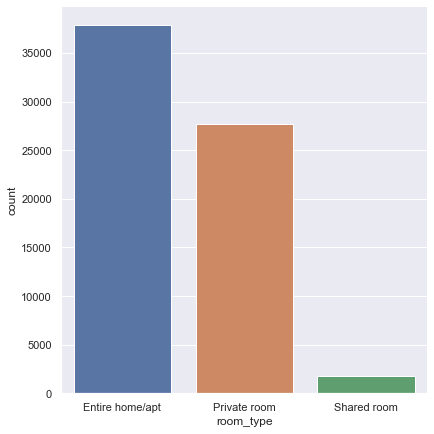

In [24]:
sns.set(font_scale=1)
sns.catplot(x="room_type",kind="count",data=df,height=6)

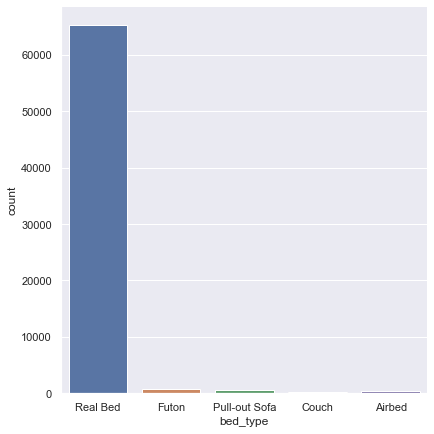

In [25]:
sns.set(font_scale=1)
sns.catplot(x="bed_type",kind="count",data=df,height=6)

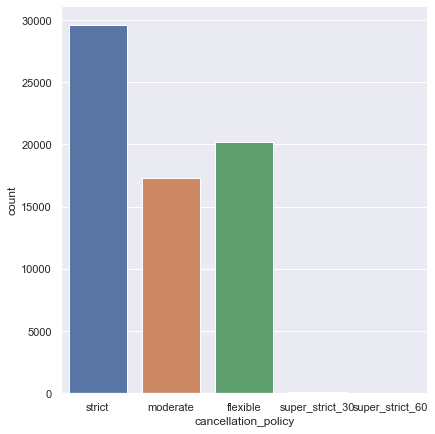

In [26]:
sns.set(font_scale=1)
sns.catplot(x="cancellation_policy",kind="count",data=df,height=6)

In [27]:
cat_data = []
for c in df.columns:
    if df[c].dtypes != "float64" and df[c].dtypes != "int64":
        cat_data.append(c)

In [28]:
cat_data

['property_type',
 'room_type',
 'bed_type',
 'cancellation_policy',
 'cleaning_fee',
 'city',
 'description',
 'first_review',
 'host_has_profile_pic',
 'host_identity_verified',
 'host_response_rate',
 'host_since',
 'instant_bookable',
 'last_review',
 'name',
 'neighbourhood',
 'thumbnail_url',
 'zipcode']

In [29]:
le = LabelEncoder()
for col in cat_data:
    df[col] = le.fit_transform(df[col])

In [30]:
df.dtypes

id                          int64
log_price                 float64
property_type               int32
room_type                   int32
amenities                   int64
accommodates                int64
bathrooms                 float64
bed_type                    int32
cancellation_policy         int32
cleaning_fee                int64
city                        int32
description                 int32
first_review                int64
host_has_profile_pic        int32
host_identity_verified      int32
host_response_rate          int32
host_since                  int64
instant_bookable            int32
last_review                 int64
latitude                  float64
longitude                 float64
name                        int32
neighbourhood               int32
number_of_reviews           int64
review_scores_rating      float64
thumbnail_url               int32
zipcode                     int32
bedrooms                  float64
beds                      float64
dtype: object

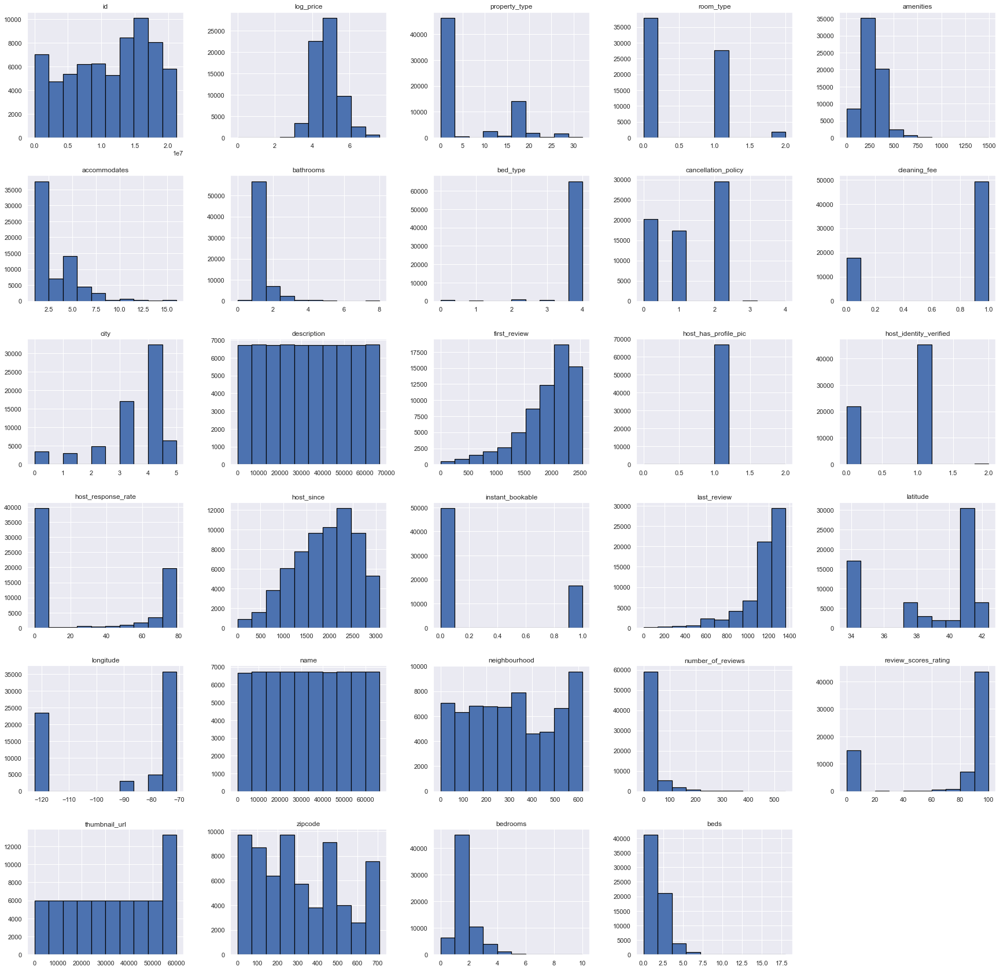

In [31]:
df.hist(edgecolor="black", linewidth=1.2, figsize=(30, 30));

<AxesSubplot:>

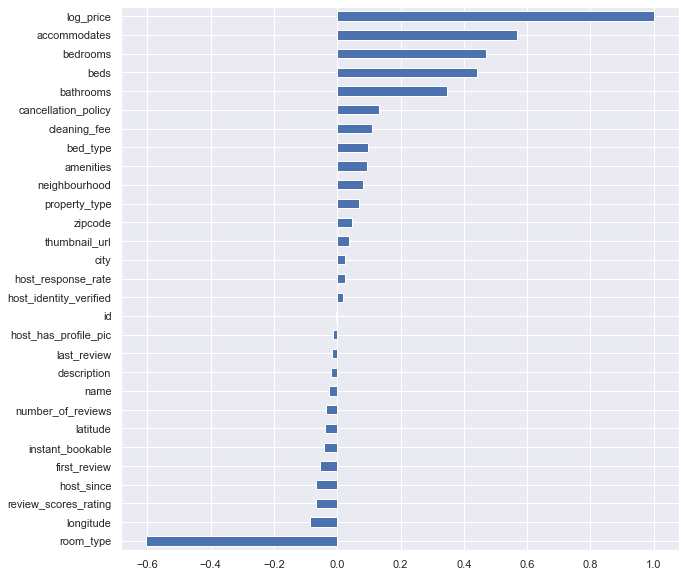

In [32]:
plt.figure(figsize=(10,10))
df.corr()["log_price"].sort_values().plot(kind="barh")

In [33]:
x = df.drop(["id","name","log_price","description","first_review","host_since","last_review","neighbourhood",
            "thumbnail_url", "zipcode","host_has_profile_pic","host_response_rate","host_identity_verified","bed_type"],axis = 1)
y = df.log_price

In [34]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.25,random_state=101)

In [35]:
LR = make_pipeline(StandardScaler(with_mean=False), LinearRegression())
LR.fit(x_train,y_train)
LR_Pred_Y = LR.predict(x_test)
print('Results For Linear Regression Model')
Mean_Absolute_Err_LR = metrics.mean_absolute_error(y_test, LR_Pred_Y)
print('Mean Absolute Error: ', Mean_Absolute_Err_LR)
Mean_Squared_Err_LR = metrics.mean_squared_error(y_test, LR_Pred_Y)
print('Mean Squarred Error: ', Mean_Squared_Err_LR)
Root_Mean_Squared_Err_LR = np.sqrt(metrics.mean_squared_error(y_test, LR_Pred_Y))
print('Root Mean Squarred Error: ', Root_Mean_Squared_Err_LR)
R2_LR = metrics.r2_score(y_test, LR_Pred_Y)
print('R2 of Linear Regression: ', R2_LR)

Results For Linear Regression Model
Mean Absolute Error:  0.361186200575807
Mean Squarred Error:  0.22675349457577115
Root Mean Squarred Error:  0.47618640738241486
R2 of Linear Regression:  0.5452468757012194


In [36]:
XGB = XGBRegressor(objective='reg:squarederror')

XGB.fit(x_train, y_train)
XGB_Pred_Y = XGB.predict(x_test)
print('Results For XGBoost Model')
Mean_Absolute_Err_xgb  = metrics.mean_absolute_error(y_test, XGB_Pred_Y)
print('Mean Absolute Error: ', Mean_Absolute_Err_xgb)
Mean_Squared_Err_xgb  = metrics.mean_squared_error(y_test, XGB_Pred_Y)
print('Mean Squarred Error: ', Mean_Squared_Err_xgb)
Root_Mean_Squared_Err_xgb = np.sqrt(metrics.mean_squared_error(y_test, XGB_Pred_Y))
print('Root Mean Squarred Error: ', Root_Mean_Squared_Err_xgb)
R2_xgb   = metrics.r2_score(y_test, XGB_Pred_Y)
print('R2 of Linear Regression: ', R2_xgb)


Results For XGBoost Model
Mean Absolute Error:  0.27713559839071233
Mean Squarred Error:  0.1437493734844864
Root Mean Squarred Error:  0.3791429459774854
R2 of Linear Regression:  0.7117112711741758


In [37]:
RF = RandomForestRegressor()
RF.fit(x_train,y_train)
RF_Pred_Y =RF.predict(x_test)
print('Results For Random Forest Model')
Mean_Absolute_Err_rf = metrics.mean_absolute_error(y_test, RF_Pred_Y)
print('Mean Absolute Error: ', Mean_Absolute_Err_rf)
Mean_Squared_Err_rf = metrics.mean_squared_error(y_test, RF_Pred_Y)
print('Mean Squarred Error: ', Mean_Squared_Err_rf)
Root_Mean_Squared_Err_rf = np.sqrt(metrics.mean_squared_error(y_test, RF_Pred_Y))
print('Root Mean Squarred Error: ', Root_Mean_Squared_Err_rf)
R2_rf = metrics.r2_score(y_test, RF_Pred_Y)
print('R2: ', R2_rf)


Results For Random Forest Model
Mean Absolute Error:  0.28023868821600023
Mean Squarred Error:  0.1495276363079033
Root Mean Squarred Error:  0.38668803486519115
R2:  0.7001229907955893


In [38]:
RidgeRegression = Pipeline([('poly', PolynomialFeatures()),('ridge', Ridge(fit_intercept=True,normalize=True))
])
parameters = {
    'poly__degree': [1, 2, 3],
    'ridge__alpha': [0.1, 0.5, 1.0, 2.0]
}
RR = GridSearchCV(RidgeRegression, parameters, cv=5)
RR.fit(x_train, y_train)
RR_Pred_Y = RR.predict(x_test)
print('Results For Ridge Regression Model')
Mean_Absolute_Err_rr  = metrics.mean_absolute_error(y_test, RR_Pred_Y)
print('Mean Absolute Error: ', Mean_Absolute_Err_rr)
Mean_Squared_Err_rr  = metrics.mean_squared_error(y_test, RR_Pred_Y)
print('Mean Squarred Error: ', Mean_Squared_Err_rr)
Root_Mean_Squared_Err_rr = np.sqrt(metrics.mean_squared_error(y_test, RR_Pred_Y))
print('Root Mean Squarred Error: ', Root_Mean_Squared_Err_rr)
R2_rr   = metrics.r2_score(y_test, RR_Pred_Y)
print('R2: ', R2_rr)

Results For Ridge Regression Model
Mean Absolute Error:  0.34137906692799036
Mean Squarred Error:  0.20440140524873338
Root Mean Squarred Error:  0.4521077363292221
R2:  0.5900738913778367


In [39]:
def pred(y_test,y_pred):
    actual_pred = {"Actual Price" : y_test.values, "Predicted Price" : y_pred}
    df3 = pd.DataFrame(actual_pred)
    return df3

In [40]:
pred(y_test,XGB_Pred_Y).head(10)

,Actual Price,Predicted Price
0,5.560682,5.979325
1,5.521461,4.948732
2,4.248495,4.319152
3,4.317488,4.210631
4,4.174387,5.103248
5,5.003946,5.270915
6,4.605170,4.523952
7,4.605170,4.774026
8,4.787492,5.242497
9,4.867534,4.848859


In [41]:
pred(y_test,LR_Pred_Y).head(10)

,Actual Price,Predicted Price
0,5.560682,6.837009
1,5.521461,5.135533
2,4.248495,4.443582
3,4.317488,4.489067
4,4.174387,4.624596
5,5.003946,5.177724
6,4.605170,4.385477
7,4.605170,5.050181
8,4.787492,4.826174
9,4.867534,5.079634


In [42]:
R2_for_all_models = {"Linear Regression": R2_LR, "Random Forest": R2_rf , "Ridge Regression": R2_rr, "XGBoost": R2_xgb}
MAE_for_all_models = {"Linear Regression": Mean_Absolute_Err_LR,"Random Forest": Mean_Absolute_Err_rf ,"Ridge Regression": Mean_Absolute_Err_rr,"XGBoost": Mean_Absolute_Err_xgb}
MSE_for_all_models = {"Linear Regression": Mean_Squared_Err_LR,"Random Forest": Mean_Squared_Err_rf ,"Ridge Regression": Mean_Squared_Err_rr,"XGBoost": Mean_Squared_Err_xgb}
RMSE_for_all_models= {"Linear Regression": Root_Mean_Squared_Err_LR,"Random Forest": Root_Mean_Squared_Err_rf ,"Ridge Regression": Root_Mean_Squared_Err_rr,"XGBoost": Root_Mean_Squared_Err_xgb}

R2 =  pd.DataFrame.from_dict(R2_for_all_models, orient = 'index', columns = ["R2 SCORE"])
MAE =  pd.DataFrame.from_dict(MAE_for_all_models, orient = 'index', columns = ["MEAN ABSOLUTE ERROR"])
MSE =  pd.DataFrame.from_dict(MSE_for_all_models, orient = 'index', columns = ["MEAN SQUARRED ERROR"])
RMS =  pd.DataFrame.from_dict(RMSE_for_all_models, orient = 'index', columns = ["ROOT MEAN SQUARRED ERROR"])
Final = pd.concat([R2, MAE, MSE, RMS], axis = 1)
Final

,R2 SCORE,MEAN ABSOLUTE ERROR,MEAN SQUARRED ERROR,ROOT MEAN SQUARRED ERROR
Linear Regression,0.545247,0.361186,0.226753,0.476186
Random Forest,0.700123,0.280239,0.149528,0.386688
Ridge Regression,0.590074,0.341379,0.204401,0.452108
XGBoost,0.711711,0.277136,0.143749,0.379143
